# Analyse morphologique et profilage comparatif des dalles

**Objectif :** Caractériser la structure géométrique et l'occupation du sol des différentes zones d'étude ("Dalles") afin de valider la cohérence des échantillons territoriaux.

**Méthodologie du traitement :**
1.  **Fusion des données :** Jointure entre le référentiel parcellaire (Cadastre) et les données attributaires d'occupation du sol (OSO 2023) via un identifiant unique standardisé.
2.  **Calcul des indicateurs morphométriques :**
    * *Dimensions :* Surfaces et périmètres (échelle logarithmique).
    * *Forme :* Indice de Gravelius (évaluation de la compacité parcellaire).
    * *Diversité :* Quantification de l'hétérogénéité des classes d'occupation du sol par parcelle.
3.  **Visualisation et synthèse :** Génération de profils graphiques comparatifs et exportation d'un tableau récapitulatif des statistiques descriptives (moyennes, médianes, écarts-types) par dalle.

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# --- 1. CONFIGURATION ---
path_csv = "C:/Users/liege/Desktop/GEOLAB/SORTIE/CSV_OSO/STAT_PARCELLES_OSO_2023.csv"
path_cadastre = "C:/Users/liege/Desktop/GEOLAB/ENTRER/CADASTRE.gpkg"
output_dir = "C:/Users/liege/Desktop/GEOLAB/ANALYSES_JUSTIFICATION"

if not os.path.exists(output_dir): os.makedirs(output_dir)

# --- 2. CHARGEMENT ET CALCULS ---
df_oso = pd.read_csv(path_csv, sep=';')
gdf_cad = gpd.read_file(path_cadastre)

df_oso['PL'] = df_oso['PL'].astype(str).str.strip().str.zfill(11)
gdf_cad['PL_KEY'] = (gdf_cad['CODE_DEP'].astype(str).str.zfill(2) + 
                     gdf_cad['CODE_COM'].astype(str).str.zfill(3) + 
                     gdf_cad['SECTION'].astype(str).str.zfill(2) + 
                     gdf_cad['NUMERO'].astype(str).str.zfill(4))

gdf = gdf_cad.merge(df_oso, left_on='PL_KEY', right_on='PL')

gdf['Aire'] = gdf.geometry.area
gdf['Perimetre'] = gdf.geometry.length
gdf['Gravelius'] = gdf['Perimetre'] / np.sqrt(4 * np.pi * gdf['Aire'])
pct_cols = [c for c in gdf.columns if c.endswith('_%')]
gdf['NB_NATURES'] = (gdf[pct_cols] > 1.0).sum(axis=1)

# --- 3. GRAPHIQUES DE COMPARAISON ---
print("Génération de la comparaison visuelle finale...")
fig, axes = plt.subplots(2, 2, figsize=(22, 16), facecolor='white')

# On définit une palette de couleur fixe pour toutes les dalles
palette_dalles = "viridis" 

# A. COURBES : Distribution des Aires (Log scale)
sns.kdeplot(data=gdf, x='Aire', hue='DALLE', ax=axes[0, 0], log_scale=True, 
            common_norm=False, palette=palette_dalles, linewidth=3)
axes[0, 0].set_title("Profil des Surfaces (Dalles)", fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel("Surface (m²) - Log scale")

# B. COURBES : Distribution des Périmètres (Log scale)
sns.kdeplot(data=gdf, x='Perimetre', hue='DALLE', ax=axes[0, 1], log_scale=True, 
            common_norm=False, palette=palette_dalles, linewidth=3)
axes[0, 1].set_title("Profil des Périmètres (Dalles)", fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel("Périmètre (m) - Log scale")

# C. COURBES : Distribution de Gravelius (Compacité)
sns.kdeplot(data=gdf, x='Gravelius', hue='DALLE', ax=axes[1, 0], 
            common_norm=False, palette=palette_dalles, linewidth=3)
axes[1, 0].set_title("Indice de Gravelius (Signatures de compacité)", fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel("Indice K (1 = compact, >1.5 = complexe)")

# D. BARRES : Diversité (Nombre de natures par parcelle)
sns.countplot(x='NB_NATURES', hue='DALLE', data=gdf, ax=axes[1, 1], palette=palette_dalles)
axes[1, 1].set_title("Diversité Interne par Parcelle", fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel("Nombre de classes OSO présentes")
axes[1, 1].set_ylabel("Nombre de parcelles")

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "COMPARAISON_PROFILS_FINALE.png"), dpi=300)

# --- 4. TABLEAU RÉCAPITULATIF (Moyennes & Médianes) ---
recap = gdf.groupby('DALLE').agg({
    'Aire': ['mean', 'median', 'std'],
    'Perimetre': ['mean', 'median', 'std'],
    'Gravelius': ['mean', 'median', 'std'],
    'NB_NATURES': ['mean', 'median']
}).round(3)
recap.columns = [f"{c[0]}_{c[1]}" for c in recap.columns]
recap.to_csv(os.path.join(output_dir, "SYNTHESE_MORPHO_FINALE.csv"), sep=';')

print(f"Opération terminée. Fichier graphique : COMPARAISON_PROFILS_FINALE.png")

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/liege/Desktop/GEOLAB/SORTIE/CSV_OSO/STAT_PARCELLES_OSO_2023.csv'

# Analyse OSO

**Objectif :** Produire des représentations cartographiques détaillées pour chaque zone d'étude ("Dalle") et visualiser l'évolution temporelle globale de l'occupation du sol.

**Méthodologie de visualisation :**

1.  **Cartes par dalle (Planches triptyques) :**
    * **Récurrence :** Visualisation de la stabilité temporelle (pourcentage d'années où la classe dominante reste identique).
    * **Fiabilité :** Représentation de la confiance moyenne (probabilité issue du modèle OSO).
    * **Occupation du Sol (Finale) :** Carte thématique de la classe majoritaire retenue (2018-2023), utilisant la nomenclature standardisée.

2.  **Analyse Temporelle (2018-2023) :**
    * Génération d'un graphique linéaire montrant l'évolution quantitative du nombre de parcelles pour chaque classe d'occupation du sol sur la période d'étude.

**Sorties :**
* Une image PNG haute résolution par dalle (3 cartes par image).
* Un graphique global d'évolution temporelle.

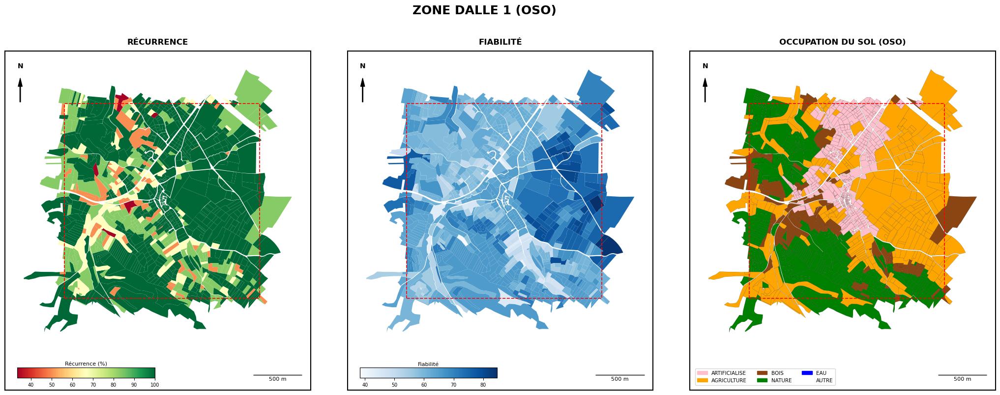

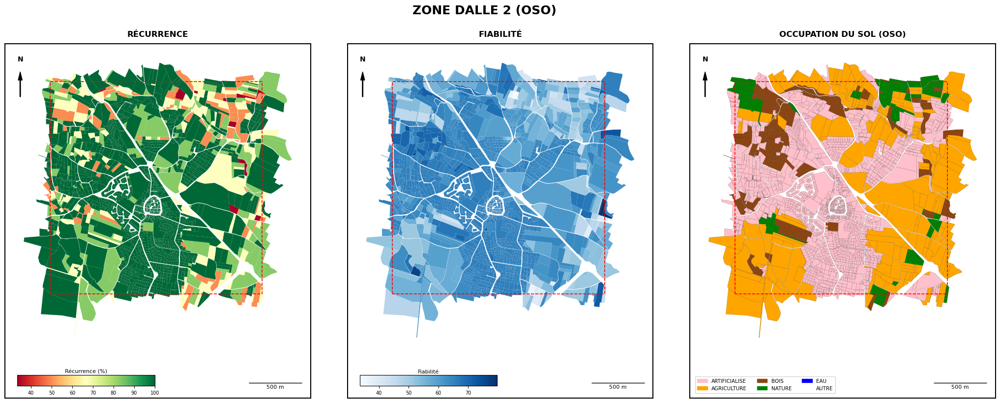

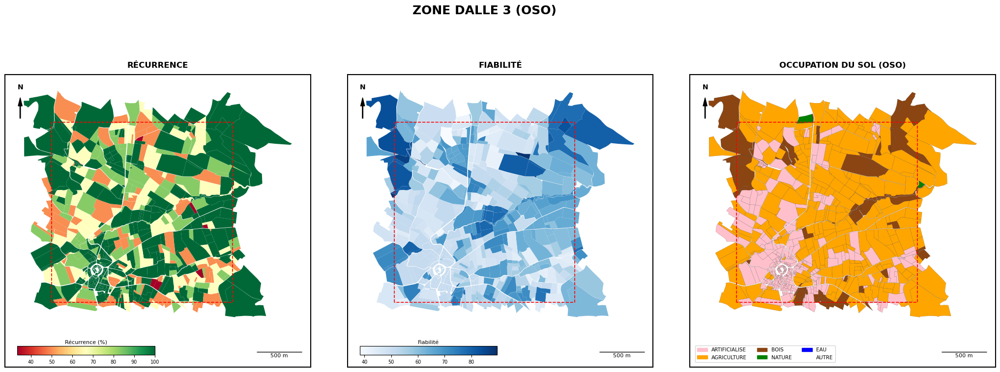

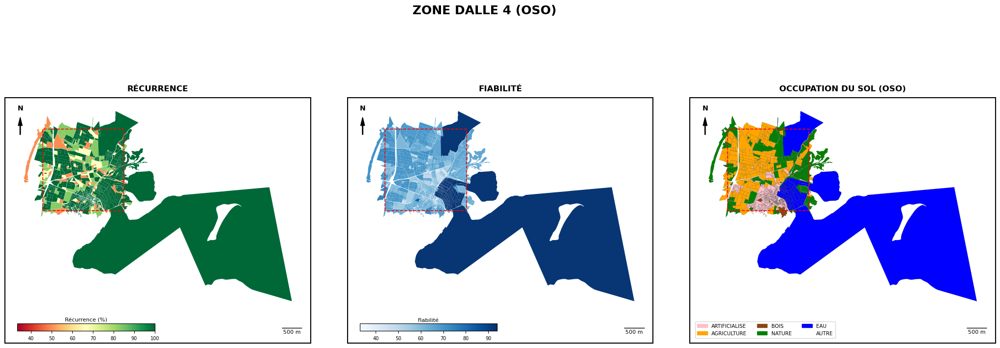

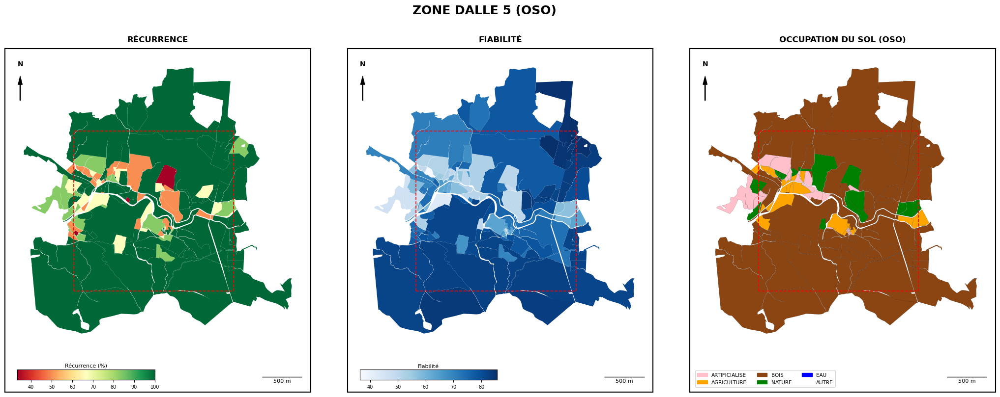

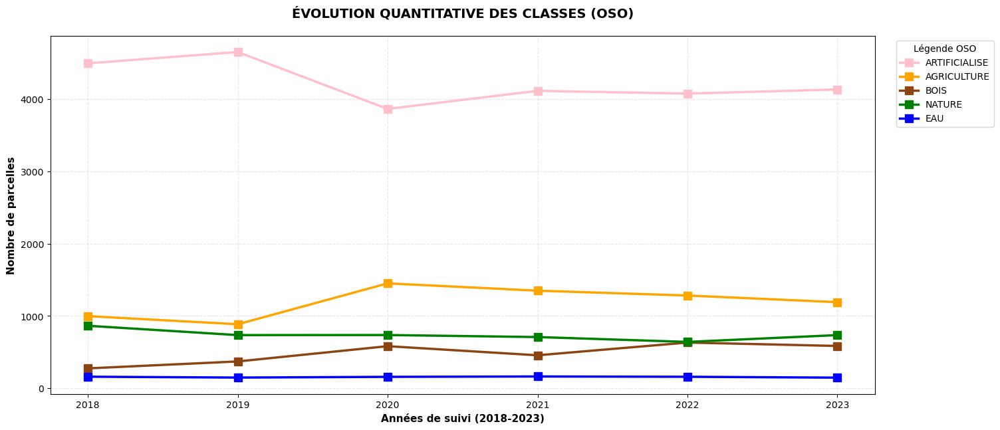

In [5]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os

# --- 1. CONFIGURATION ET RÉPERTOIRE ---
output_dir = "C:/Users/liege/Desktop/GEOLAB/SORTIE_CARTES_OSO"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

COLOR_MAPPING = {
    'ARTIFICIALISE': '#ffc0cb', 'AGRICULTURE': '#ffa500', 'BOIS': '#8b4513',
    'NATURE': '#008000', 'EAU': '#0000ff', 'AUTRE': '#ffffff'
}
OSO_CATEGORIES = list(COLOR_MAPPING.keys())
CUSTOM_CMAP = ListedColormap(list(COLOR_MAPPING.values()))

# --- 2. CHARGEMENT ET JOINTURE ---
gdf_zones = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/ZONE.gpkg")
gdf_cad = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/CADASTRE.gpkg")
df_attr = pd.read_csv("C:/Users/liege/Desktop/GEOLAB/SORTIE/SYNTHESE_OSO_FREQUENCE.csv", sep=None, engine='python')
df_attr.columns = df_attr.columns.str.strip()

gdf_cad['PL_KEY'] = (gdf_cad['CODE_DEP'].astype(str) + 
                     gdf_cad['CODE_COM'].astype(str).str.zfill(3) + 
                     gdf_cad['SECTION'].astype(str).str.zfill(2) + 
                     gdf_cad['NUMERO'].astype(str).str.zfill(4))

gdf_complet = gdf_cad.merge(df_attr, left_on='PL_KEY', right_on='PL', how='inner')
gdf_complet['DOM_OSO_FINALE'] = pd.Categorical(gdf_complet['DOM_OSO_FINALE'], categories=OSO_CATEGORIES)

# --- 3. MISE EN PAGE TECHNIQUE ---
def apply_layout(ax, title, geom_dalle, parcelles_bounds):
    minx, miny, maxx, maxy = parcelles_bounds
    margin_side = 0.07
    margin_bottom = 0.22 
    
    ax.set_xlim(minx - (maxx-minx)*margin_side, maxx + (maxx-minx)*margin_side)
    ax.set_ylim(miny - (maxy-miny)*margin_bottom, maxy + (maxy-miny)*margin_side)
    
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True); spine.set_linewidth(1.5); spine.set_edgecolor('black')

    ax.annotate('', xy=(0.05, 0.92), xytext=(0.05, 0.85), xycoords='axes fraction',
                arrowprops=dict(facecolor='black', width=1, headwidth=6))
    ax.text(0.05, 0.95, 'N', transform=ax.transAxes, fontsize=10, fontweight='bold', ha='center')
    
    scalebar = AnchoredSizeBar(ax.transData, 500, '500 m', loc='lower right', pad=1.5, 
                               color='black', frameon=False, size_vertical=2, fontproperties={'size': 8})
    ax.add_artist(scalebar)
    
    gpd.GeoSeries([geom_dalle]).boundary.plot(ax=ax, color='red', linewidth=1.2, linestyle='--', zorder=10)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)

# --- 4. GÉNÉRATION DES BANDES DE DALLES (TRIÉES ET TITRÉES OSO) ---
for idx, zone in gdf_zones.sort_values('DALLE').iterrows():
    nom_dalle = zone['DALLE']
    geom_dalle = zone['geometry']
    parcelles_dalle = gdf_complet[gdf_complet.intersects(geom_dalle)].copy()
    
    if parcelles_dalle.empty: continue
    bounds = parcelles_dalle.total_bounds 

    fig, axes = plt.subplots(1, 3, figsize=(26, 10), facecolor='white')
    fig.suptitle(f"ZONE DALLE {nom_dalle} (OSO)", fontsize=18, fontweight='bold', y=0.92)

    # 1. RÉCURRENCE
    ax = axes[0]
    ax_ins1 = inset_axes(ax, width="45%", height="3%", loc='lower left', borderpad=1.8)
    parcelles_dalle.plot(column='SCORE_STABILITE', ax=ax, cmap='RdYlGn', 
                         legend=True, cax=ax_ins1, legend_kwds={'orientation': "horizontal"})
    ax_ins1.set_title("Récurrence (%)", fontsize=8, pad=3)
    ax_ins1.tick_params(labelsize=7)
    apply_layout(ax, "RÉCURRENCE", geom_dalle, bounds)

    # 2. FIABILITÉ
    ax = axes[1]
    ax_ins2 = inset_axes(ax, width="45%", height="3%", loc='lower left', borderpad=1.8)
    parcelles_dalle.plot(column='PROBA_MOY_ELU', ax=ax, cmap='Blues', 
                         legend=True, cax=ax_ins2, legend_kwds={'orientation': "horizontal"})
    ax_ins2.set_title("Fiabilité", fontsize=8, pad=3)
    ax_ins2.tick_params(labelsize=7)
    apply_layout(ax, "FIABILITÉ", geom_dalle, bounds)

    # 3. OSO FINALE
    ax = axes[2]
    parcelles_dalle.plot(column='DOM_OSO_FINALE', ax=ax, cmap=CUSTOM_CMAP, categorical=True, edgecolor='black', linewidth=0.1)
    patches = [plt.Rectangle((0,0),1,1, color=COLOR_MAPPING[cat]) for cat in OSO_CATEGORIES]
    ax.legend(patches, OSO_CATEGORIES, loc='lower left', ncol=3, fontsize=7.5, frameon=True, borderaxespad=1.0)
    apply_layout(ax, "OCCUPATION DU SOL (OSO)", geom_dalle, bounds)

    plt.subplots_adjust(wspace=0.12, top=0.85)
    plt.savefig(os.path.join(output_dir, f"ZONE_DALLE_OSO_{nom_dalle}.png"), dpi=300, bbox_inches='tight')
    plt.show()

# --- 5. GRAPHIQUE D'ÉVOLUTION OSO ---
cols_temp = ['DOM_2018', 'DOM_2019', 'DOM_2020', 'DOM_2021', 'DOM_2022', 'DOM_2023']
df_evol = df_attr[cols_temp].apply(pd.Series.value_counts).T
df_evol.index = [c.split('_')[1] for c in df_evol.index]

plt.figure(figsize=(16, 7), facecolor='white')
for cat in OSO_CATEGORIES:
    if cat in df_evol.columns:
        plt.plot(df_evol.index, df_evol[cat], marker='s', label=cat, color=COLOR_MAPPING[cat], 
                 linewidth=2.5, markersize=8, markeredgecolor='black' if cat == 'AUTRE' else COLOR_MAPPING[cat])

plt.title("ÉVOLUTION QUANTITATIVE DES CLASSES (OSO)", fontsize=14, fontweight='bold', pad=20)
plt.xlabel("Années de suivi (2018-2023)", fontsize=11, fontweight='bold')
plt.ylabel("Nombre de parcelles", fontsize=11, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title="Légende OSO", bbox_to_anchor=(1.02, 1), loc='upper left')

plt.savefig(os.path.join(output_dir, "EVOLUTION_GENERALE_OSO.png"), dpi=300, bbox_inches='tight')
plt.show()

# Analyse COSIA

**Objectif :** Produire des représentations cartographiques détaillées pour chaque zone d'étude ("Dalle") à partir de la source COSIA et visualiser l'évolution temporelle globale de l'occupation du sol.

**Méthodologie de visualisation :**

1.  **Cartes par dalle (Planches triptyques) :**
    * **Récurrence :** Visualisation de la stabilité temporelle (pourcentage d'années où la classe dominante reste identique).
    * **Fiabilité :** Représentation de la confiance moyenne (probabilité issue des données sources).
    * **Occupation du Sol (COSIA) :** Carte thématique de la classe majoritaire retenue (2018-2021-2024), utilisant la nomenclature standardisée.

2.  **Analyse Temporelle :**
    * Génération d'un graphique linéaire montrant l'évolution quantitative du nombre de parcelles pour chaque classe d'occupation du sol sur les différents millésimes COSIA.

**Sorties :**
* Une image PNG haute résolution par dalle (3 cartes par image).
* Un graphique global d'évolution temporelle.

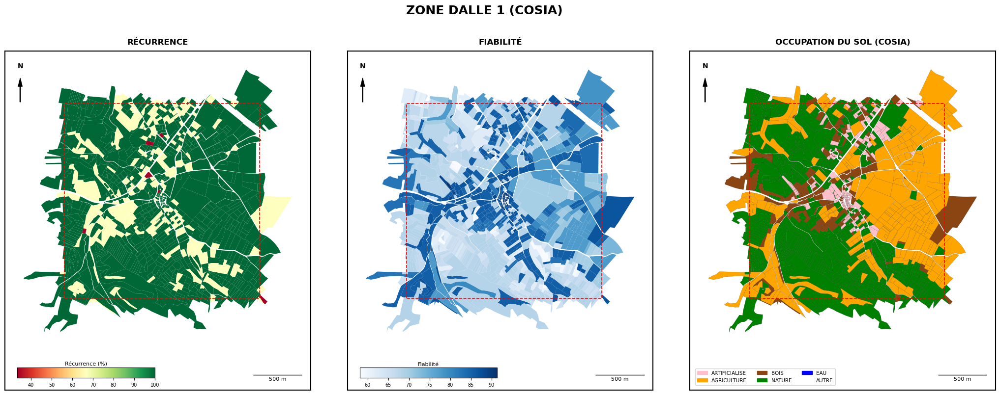

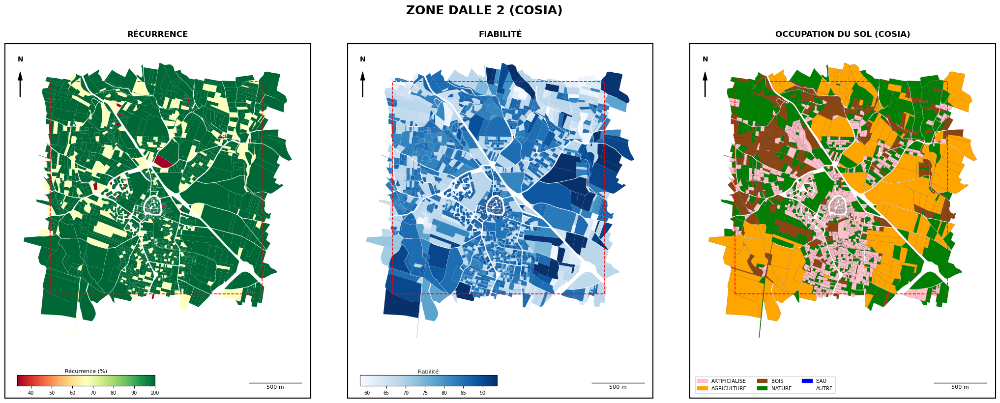

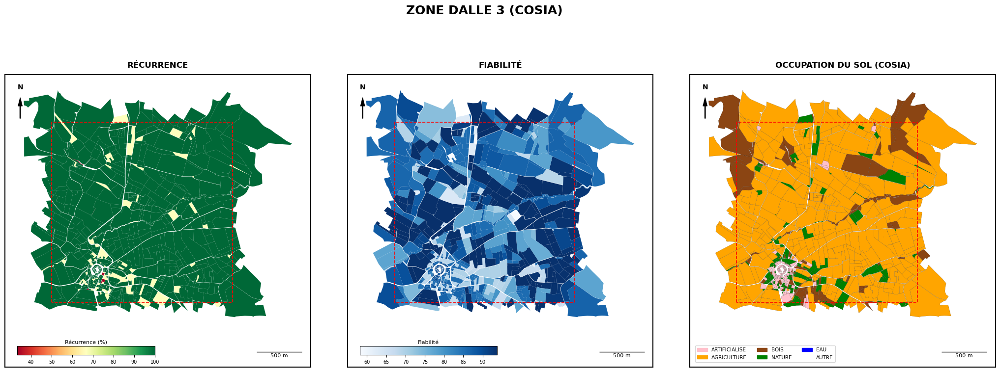

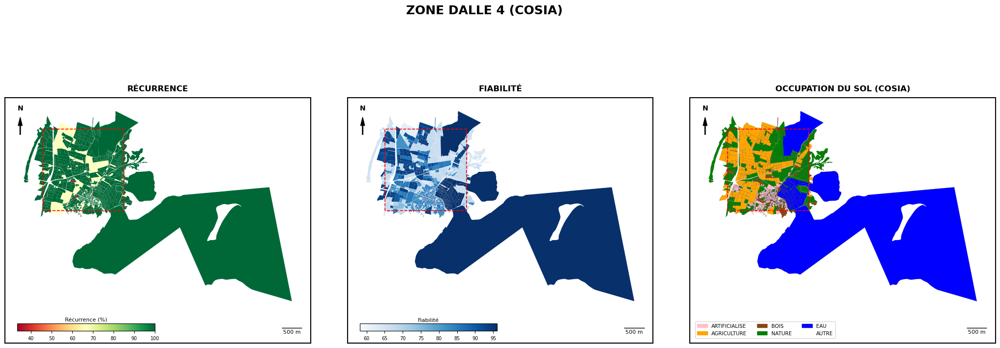

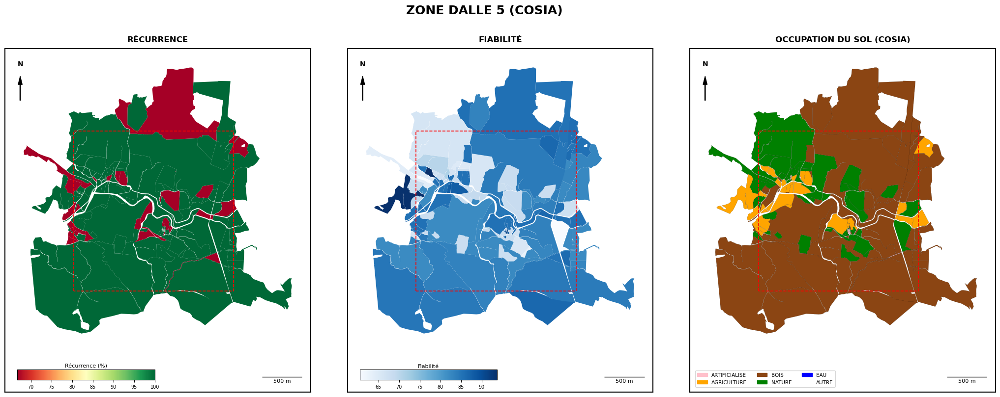

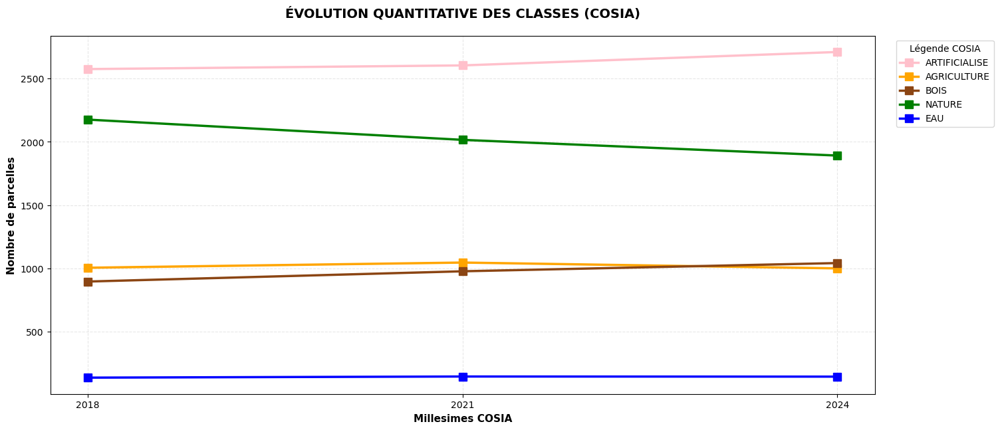

In [3]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os

# --- 1. CONFIGURATION ET RÉPERTOIRE ---
output_dir = "C:/Users/liege/Desktop/GEOLAB/SORTIE_CARTES_COSIA"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

COLOR_MAPPING = {
    'ARTIFICIALISE': '#ffc0cb', 'AGRICULTURE': '#ffa500', 'BOIS': '#8b4513',
    'NATURE': '#008000', 'EAU': '#0000ff', 'AUTRE': '#ffffff'
}
COSIA_CATEGORIES = list(COLOR_MAPPING.keys())
CUSTOM_CMAP = ListedColormap(list(COLOR_MAPPING.values()))

# --- 2. CHARGEMENT ET JOINTURE ---
gdf_zones = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/ZONE.gpkg")
gdf_cad = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/CADASTRE.gpkg")

# Chargement du fichier de synthèse COSIA
df_attr = pd.read_csv("C:/Users/liege/Desktop/GEOLAB/SORTIE/SYNTHESE_COSIA_FREQUENCE.csv", sep=None, engine='python')
df_attr.columns = df_attr.columns.str.strip()

gdf_cad['PL_KEY'] = (gdf_cad['CODE_DEP'].astype(str) + 
                     gdf_cad['CODE_COM'].astype(str).str.zfill(3) + 
                     gdf_cad['SECTION'].astype(str).str.zfill(2) + 
                     gdf_cad['NUMERO'].astype(str).str.zfill(4))

gdf_complet = gdf_cad.merge(df_attr, left_on='PL_KEY', right_on='PL', how='inner')
gdf_complet['COSIA_CLASSE_FINALE'] = pd.Categorical(gdf_complet['COSIA_CLASSE_FINALE'], categories=COSIA_CATEGORIES)

# --- 3. MISE EN PAGE TECHNIQUE ---
def apply_layout(ax, title, geom_dalle, parcelles_bounds):
    minx, miny, maxx, maxy = parcelles_bounds
    margin_side = 0.07
    margin_bottom = 0.22 
    
    ax.set_xlim(minx - (maxx-minx)*margin_side, maxx + (maxx-minx)*margin_side)
    ax.set_ylim(miny - (maxy-miny)*margin_bottom, maxy + (maxy-miny)*margin_side)
    
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True); spine.set_linewidth(1.5); spine.set_edgecolor('black')

    ax.annotate('', xy=(0.05, 0.92), xytext=(0.05, 0.85), xycoords='axes fraction',
                arrowprops=dict(facecolor='black', width=1, headwidth=6))
    ax.text(0.05, 0.95, 'N', transform=ax.transAxes, fontsize=10, fontweight='bold', ha='center')
    
    scalebar = AnchoredSizeBar(ax.transData, 500, '500 m', loc='lower right', pad=1.5, 
                               color='black', frameon=False, size_vertical=2, fontproperties={'size': 8})
    ax.add_artist(scalebar)
    
    gpd.GeoSeries([geom_dalle]).boundary.plot(ax=ax, color='red', linewidth=1.2, linestyle='--', zorder=10)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)

# --- 4. GÉNÉRATION DES BANDES DE DALLES (TRIÉES) ---
for idx, zone in gdf_zones.sort_values('DALLE').iterrows():
    nom_dalle = zone['DALLE']
    geom_dalle = zone['geometry']
    parcelles_dalle = gdf_complet[gdf_complet.intersects(geom_dalle)].copy()
    
    if parcelles_dalle.empty: continue
    bounds = parcelles_dalle.total_bounds 

    fig, axes = plt.subplots(1, 3, figsize=(26, 10), facecolor='white')
    fig.suptitle(f"ZONE DALLE {nom_dalle} (COSIA)", fontsize=18, fontweight='bold', y=0.92)

    # 1. RÉCURRENCE
    ax = axes[0]
    ax_ins1 = inset_axes(ax, width="45%", height="3%", loc='lower left', borderpad=1.8)
    parcelles_dalle.plot(column='SCORE_STABILITE', ax=ax, cmap='RdYlGn', 
                         legend=True, cax=ax_ins1, legend_kwds={'orientation': "horizontal"})
    ax_ins1.set_title("Récurrence (%)", fontsize=8, pad=3)
    ax_ins1.tick_params(labelsize=7)
    apply_layout(ax, "RÉCURRENCE", geom_dalle, bounds)

    # 2. FIABILITÉ
    ax = axes[1]
    ax_ins2 = inset_axes(ax, width="45%", height="3%", loc='lower left', borderpad=1.8)
    parcelles_dalle.plot(column='PROBA_MOYENNE', ax=ax, cmap='Blues', 
                         legend=True, cax=ax_ins2, legend_kwds={'orientation': "horizontal"})
    ax_ins2.set_title("Fiabilité", fontsize=8, pad=3)
    ax_ins2.tick_params(labelsize=7)
    apply_layout(ax, "FIABILITÉ", geom_dalle, bounds)

    # 3. COSIA FINALE
    ax = axes[2]
    parcelles_dalle.plot(column='COSIA_CLASSE_FINALE', ax=ax, cmap=CUSTOM_CMAP, categorical=True, edgecolor='black', linewidth=0.1)
    patches = [plt.Rectangle((0,0),1,1, color=COLOR_MAPPING[cat]) for cat in COSIA_CATEGORIES]
    ax.legend(patches, COSIA_CATEGORIES, loc='lower left', ncol=3, fontsize=7.5, frameon=True, borderaxespad=1.0)
    apply_layout(ax, "OCCUPATION DU SOL (COSIA)", geom_dalle, bounds)

    plt.subplots_adjust(wspace=0.12, top=0.85)
    plt.savefig(os.path.join(output_dir, f"ZONE_DALLE_COSIA_{nom_dalle}.png"), dpi=300, bbox_inches='tight')
    plt.show()

# --- 5. GRAPHIQUE D'ÉVOLUTION ---
cols_temp = [c for c in df_attr.columns if c.startswith('DOM_')]
df_evol = df_attr[cols_temp].apply(pd.Series.value_counts).T
df_evol.index = [c.split('_')[1] for c in df_evol.index]

plt.figure(figsize=(16, 7), facecolor='white')
for cat in COSIA_CATEGORIES:
    if cat in df_evol.columns:
        plt.plot(df_evol.index, df_evol[cat], marker='s', label=cat, color=COLOR_MAPPING[cat], 
                 linewidth=2.5, markersize=8, markeredgecolor='black' if cat == 'AUTRE' else COLOR_MAPPING[cat])

plt.title("ÉVOLUTION QUANTITATIVE DES CLASSES (COSIA)", fontsize=14, fontweight='bold', pad=20)
plt.xlabel("Millesimes COSIA", fontsize=11, fontweight='bold')
plt.ylabel("Nombre de parcelles", fontsize=11, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title="Légende COSIA", bbox_to_anchor=(1.02, 1), loc='upper left')

plt.savefig(os.path.join(output_dir, "EVOLUTION_GENERALE_COSIA.png"), dpi=300, bbox_inches='tight')
plt.show()

# Analyse BD FORET V2

**Objectif :** Produire une visualisation synthétique de la couverture végétale (forestière et naturelle) sur l'ensemble des zones d'étude, en s'appuyant sur le référentiel institutionnel de l'IGN.

**Méthodologie de visualisation :**
1.  **Classification simplifiée :** Projection des données selon une nomenclature ternaire pour maximiser la lisibilité : *Bois* (Forêts fermées/ouvertes), *Nature* (Landes, milieux herbacés) et *Autre*.
2.  **Mise en page panoramique :** Génération d'une planche unique alignant horizontalement toutes les dalles. Cette disposition permet une comparaison visuelle immédiate de la densité forestière et de la fragmentation entre les différents territoires.

**Sorties :**
* Une planche cartographique "Panorama" haute résolution regroupant l'analyse de toutes les zones.

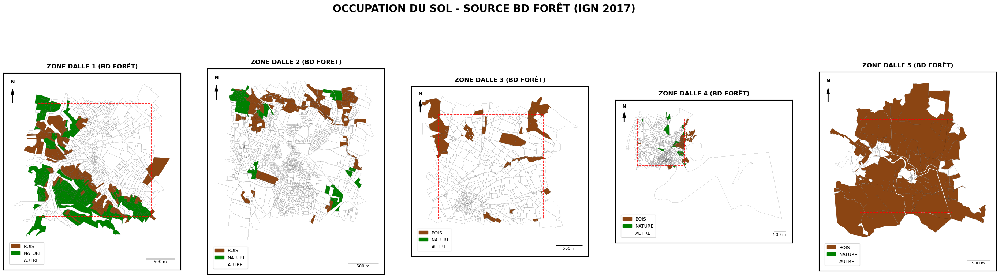

In [9]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import os

# --- 1. CONFIGURATION ---
output_dir = "C:/Users/liege/Desktop/GEOLAB/SORTIE_CARTES_FORET"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Nomenclature simplifiée : Bois, Nature, Autre
COLOR_MAPPING = {
    'BOIS': '#8b4513',
    'NATURE': '#008000',
    'AUTRE': '#ffffff'
}
CATEGORIES = list(COLOR_MAPPING.keys())
CUSTOM_CMAP = ListedColormap([COLOR_MAPPING[cat] for cat in CATEGORIES])

# --- 2. CHARGEMENT ET JOINTURE ---
gdf_zones = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/ZONE.gpkg")
gdf_cad = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/CADASTRE.gpkg")
df_foret = pd.read_csv("C:/Users/liege/Desktop/GEOLAB/SORTIE/CSV_FORET/STAT_PARCELLES_FORET_2017.csv", sep=None, engine='python')
df_foret.columns = df_foret.columns.str.strip()

gdf_cad['PL_KEY'] = (gdf_cad['CODE_DEP'].astype(str) + 
                     gdf_cad['CODE_COM'].astype(str).str.zfill(3) + 
                     gdf_cad['SECTION'].astype(str).str.zfill(2) + 
                     gdf_cad['NUMERO'].astype(str).str.zfill(4))

gdf_complet = gdf_cad.merge(df_foret, left_on='PL_KEY', right_on='PL', how='inner')
gdf_complet['DOMINANTE'] = pd.Categorical(gdf_complet['DOMINANTE'], categories=CATEGORIES)

# --- 3. MISE EN PAGE TECHNIQUE ---
def apply_layout(ax, title, geom_dalle, parcelles_bounds):
    minx, miny, maxx, maxy = parcelles_bounds
    
    # Marge basse de 22% pour loger la légende
    margin_side = 0.07
    margin_bottom = 0.22 
    
    ax.set_xlim(minx - (maxx-minx)*margin_side, maxx + (maxx-minx)*margin_side)
    ax.set_ylim(miny - (maxy-miny)*margin_bottom, maxy + (maxy-miny)*margin_side)
    
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True); spine.set_linewidth(1.5); spine.set_edgecolor('black')

    # Nord
    ax.annotate('', xy=(0.05, 0.92), xytext=(0.05, 0.85), xycoords='axes fraction',
                arrowprops=dict(facecolor='black', width=1, headwidth=6))
    ax.text(0.05, 0.95, 'N', transform=ax.transAxes, fontsize=10, fontweight='bold', ha='center')
    
    # Échelle
    scalebar = AnchoredSizeBar(ax.transData, 500, '500 m', loc='lower right', pad=1.5, 
                               color='black', frameon=False, size_vertical=2, fontproperties={'size': 8})
    ax.add_artist(scalebar)
    
    gpd.GeoSeries([geom_dalle]).boundary.plot(ax=ax, color='red', linewidth=1.2, linestyle='--', zorder=10)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)

# --- 4. GÉNÉRATION PANORAMIQUE (DALLES TRIÉES SUR UNE LIGNE) ---
# Tri des dalles pour l'ordre 1, 2, 3...
gdf_zones_sorted = gdf_zones.sort_values('DALLE')
nb_dalles = len(gdf_zones_sorted)

fig = plt.figure(figsize=(7 * nb_dalles, 10), facecolor='white')
gs = gridspec.GridSpec(1, nb_dalles, figure=fig)

fig.suptitle("OCCUPATION DU SOL - SOURCE BD FORÊT (IGN 2017)", fontsize=20, fontweight='bold', y=0.95)

for i, (idx, zone) in enumerate(gdf_zones_sorted.iterrows()):
    ax = fig.add_subplot(gs[i])
    nom_dalle = zone['DALLE']
    geom_dalle = zone['geometry']
    parcelles_dalle = gdf_complet[gdf_complet.intersects(geom_dalle)].copy()
    
    if not parcelles_dalle.empty:
        bounds = parcelles_dalle.total_bounds
        parcelles_dalle.plot(column='DOMINANTE', ax=ax, cmap=CUSTOM_CMAP, edgecolor='black', linewidth=0.1)
        
        # Légende interne
        patches = [plt.Rectangle((0,0),1,1, color=COLOR_MAPPING[cat]) for cat in CATEGORIES]
        ax.legend(patches, CATEGORIES, loc='lower left', ncol=1, fontsize=9, frameon=True, borderaxespad=1.2)
        
        # Titre avec mention (BD FORÊT)
        apply_layout(ax, f"ZONE DALLE {nom_dalle} (BD FORÊT)", geom_dalle, bounds)
    else:
        ax.axis('off')

plt.subplots_adjust(wspace=0.15, top=0.88, bottom=0.1)

# Sauvegarde
plt.savefig(os.path.join(output_dir, "PANORAMA_BD_FORET_2017.png"), dpi=300, bbox_inches='tight')
plt.show()

# Analyse BD TOPO

**Objectif :** Générer une visualisation détaillée de la structure de l'occupation du sol sur les zones d'étude, basée sur les vecteurs topographiques de référence (Bâtiments, Eau, etc.).

**Méthodologie de visualisation :**
1.  **Classification standardisée :** Représentation selon une nomenclature complète en 6 classes (*Artificialisé, Agriculture, Bois, Nature, Eau, Autre*), permettant une lecture fine des dynamiques anthropiques et naturelles.
2.  **Mise en page panoramique :** Production d'une planche unique alignant les dalles horizontalement. Cette vue d'ensemble facilite la comparaison des tissus urbains et ruraux entre les différents sites échantillonnés.

**Livrable :**
* Une planche cartographique "Panorama" haute résolution illustrant la classe dominante pour chaque parcelle selon la BD TOPO.

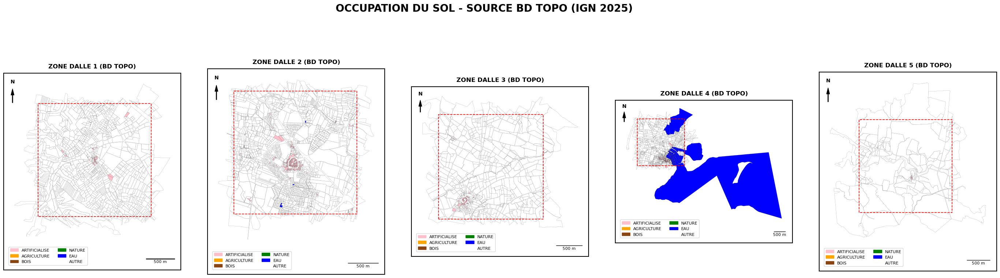

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import os

# --- 1. CONFIGURATION ---
output_dir = "C:/Users/liege/Desktop/GEOLAB/SORTIE_CARTES_BDTOPO"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Nomenclature complète BD TOPO
COLOR_MAPPING = {
    'ARTIFICIALISE': '#ffc0cb', 
    'AGRICULTURE': '#ffa500', 
    'BOIS': '#8b4513',
    'NATURE': '#008000', 
    'EAU': '#0000ff', 
    'AUTRE': '#ffffff'
}
CATEGORIES = list(COLOR_MAPPING.keys())
CUSTOM_CMAP = ListedColormap([COLOR_MAPPING[cat] for cat in CATEGORIES])

# --- 2. CHARGEMENT ET JOINTURE ---
gdf_zones = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/ZONE.gpkg")
gdf_cad = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/CADASTRE.gpkg")
df_topo = pd.read_csv("C:/Users/liege/Desktop/GEOLAB/SORTIE/CSV_BDTOPO/STAT_PARCELLES_BDTOPO_2025.csv", sep=';', engine='python')
df_topo.columns = df_topo.columns.str.strip()

gdf_cad['PL_KEY'] = (gdf_cad['CODE_DEP'].astype(str) + 
                     gdf_cad['CODE_COM'].astype(str).str.zfill(3) + 
                     gdf_cad['SECTION'].astype(str).str.zfill(2) + 
                     gdf_cad['NUMERO'].astype(str).str.zfill(4))

gdf_complet = gdf_cad.merge(df_topo, left_on='PL_KEY', right_on='PL', how='inner')
gdf_complet['DOMINANTE'] = pd.Categorical(gdf_complet['DOMINANTE'], categories=CATEGORIES)

# --- 3. MISE EN PAGE TECHNIQUE ---
def apply_layout(ax, title, geom_dalle, parcelles_bounds):
    minx, miny, maxx, maxy = parcelles_bounds
    margin_side = 0.07
    margin_bottom = 0.22 
    
    ax.set_xlim(minx - (maxx-minx)*margin_side, maxx + (maxx-minx)*margin_side)
    ax.set_ylim(miny - (maxy-miny)*margin_bottom, maxy + (maxy-miny)*margin_side)
    
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True); spine.set_linewidth(1.5); spine.set_edgecolor('black')

    ax.annotate('', xy=(0.05, 0.92), xytext=(0.05, 0.85), xycoords='axes fraction',
                arrowprops=dict(facecolor='black', width=1, headwidth=6))
    ax.text(0.05, 0.95, 'N', transform=ax.transAxes, fontsize=10, fontweight='bold', ha='center')
    
    scalebar = AnchoredSizeBar(ax.transData, 500, '500 m', loc='lower right', pad=1.5, 
                               color='black', frameon=False, size_vertical=2, fontproperties={'size': 8})
    ax.add_artist(scalebar)
    
    gpd.GeoSeries([geom_dalle]).boundary.plot(ax=ax, color='red', linewidth=1.2, linestyle='--', zorder=10)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)

# --- 4. GÉNÉRATION PANORAMIQUE (ORDRE TRIÉ PAR DALLE) ---
gdf_zones_sorted = gdf_zones.sort_values('DALLE')
nb_dalles = len(gdf_zones_sorted)

fig = plt.figure(figsize=(7 * nb_dalles, 10), facecolor='white')
gs = gridspec.GridSpec(1, nb_dalles, figure=fig)

fig.suptitle("OCCUPATION DU SOL - SOURCE BD TOPO (IGN 2025)", fontsize=20, fontweight='bold', y=0.95)

for i, (idx, zone) in enumerate(gdf_zones_sorted.iterrows()):
    ax = fig.add_subplot(gs[i])
    nom_dalle = zone['DALLE']
    geom_dalle = zone['geometry']
    parcelles_dalle = gdf_complet[gdf_complet.intersects(geom_dalle)].copy()
    
    if not parcelles_dalle.empty:
        bounds = parcelles_dalle.total_bounds
        parcelles_dalle.plot(column='DOMINANTE', ax=ax, cmap=CUSTOM_CMAP, edgecolor='black', linewidth=0.1)
        
        # Légende interne complète (6 classes)
        patches = [plt.Rectangle((0,0),1,1, color=COLOR_MAPPING[cat]) for cat in CATEGORIES]
        ax.legend(patches, CATEGORIES, loc='lower left', ncol=2, fontsize=8, frameon=True, borderaxespad=1.2)
        
        # Titre harmonisé
        apply_layout(ax, f"ZONE DALLE {nom_dalle} (BD TOPO)", geom_dalle, bounds)
    else:
        ax.axis('off')

plt.subplots_adjust(wspace=0.15, top=0.88, bottom=0.1)

# Sauvegarde
plt.savefig(os.path.join(output_dir, "PANORAMA_BD_TOPO_2025.png"), dpi=300, bbox_inches='tight')
plt.show()

# Analyse RPG FUSION

**Objectif :** Spatialiser les déclarations du Registre Parcellaire Graphique (RPG standard et complet) sur les zones d'étude et analyser la cohérence temporelle des usages agricoles déclarés.

**Méthodologie de visualisation :**

1.  **Cartes par dalle (Planches Triptyques) :**
    * **Stabilité :** Visualisation de la récurrence des déclarations (fidélité de l'usage déclaré au fil des campagnes).
    * **Fiabilité :** Représentation de la probabilité pondérée (ratio de recouvrement géométrique entre l'îlot RPG et la parcelle cadastrale).
    * **Usage du Sol (RPG) :** Carte de l'usage dominant final, reclassé selon la nomenclature harmonisée.

2.  **Analyse temporelle :**
    * Génération d'un graphique d'évolution quantitative des classes thématiques.
    * *Note spécifique :* La classe générique **"AUTRE"** est exclue de cette visualisation graphique afin de mettre en évidence les dynamiques propres aux catégories agricoles, forestières et naturelles.

**Sorties :**
* Une planche haute résolution par zone.
* Un graphique synthétique des trajectoires agricoles.

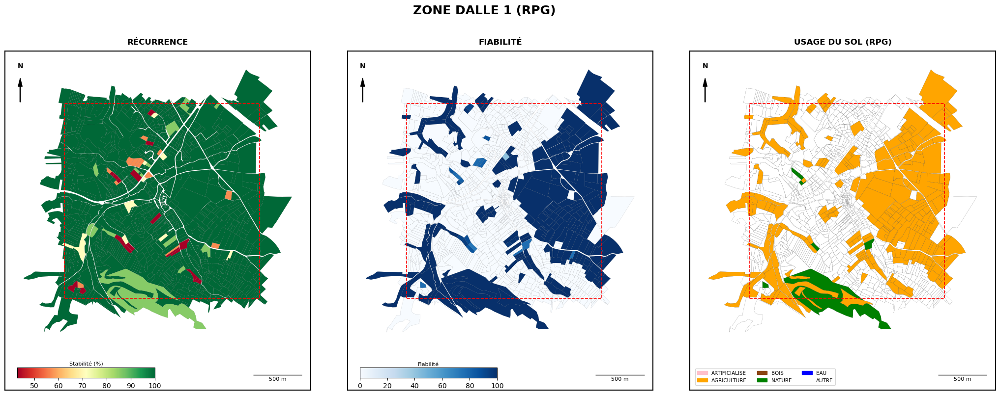

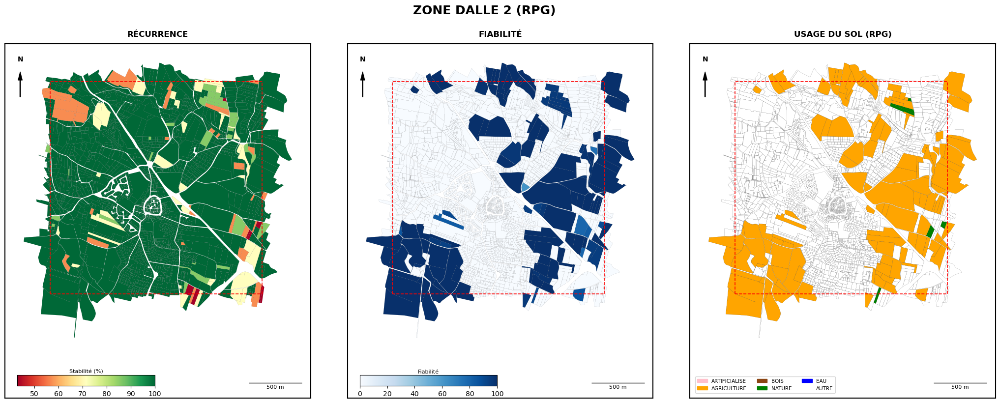

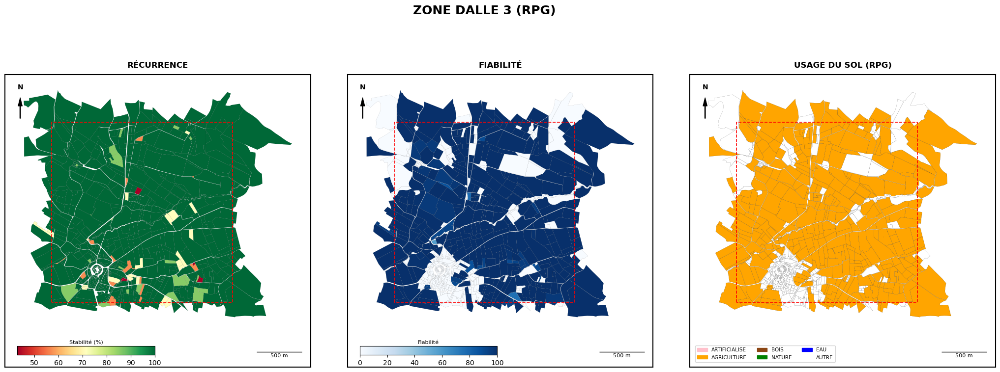

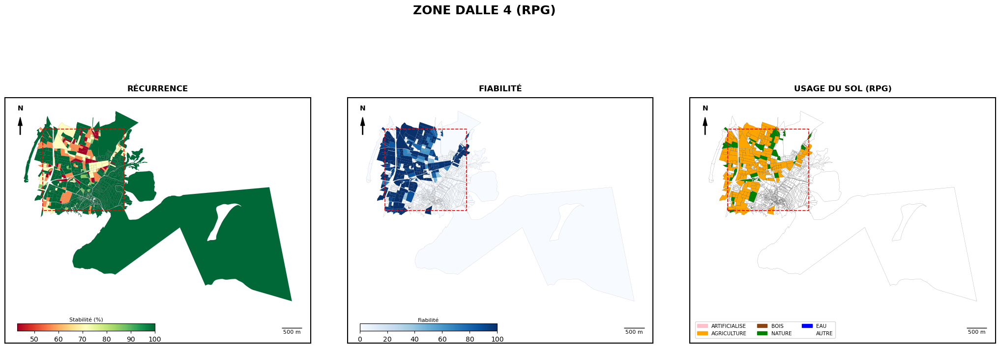

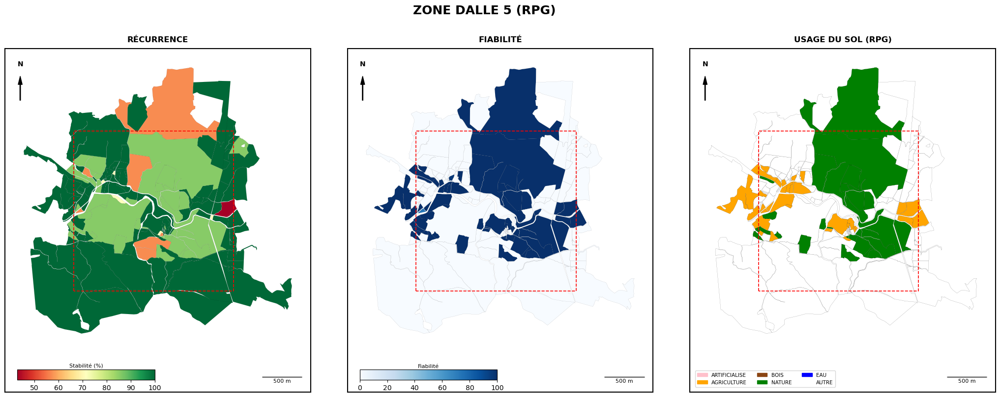

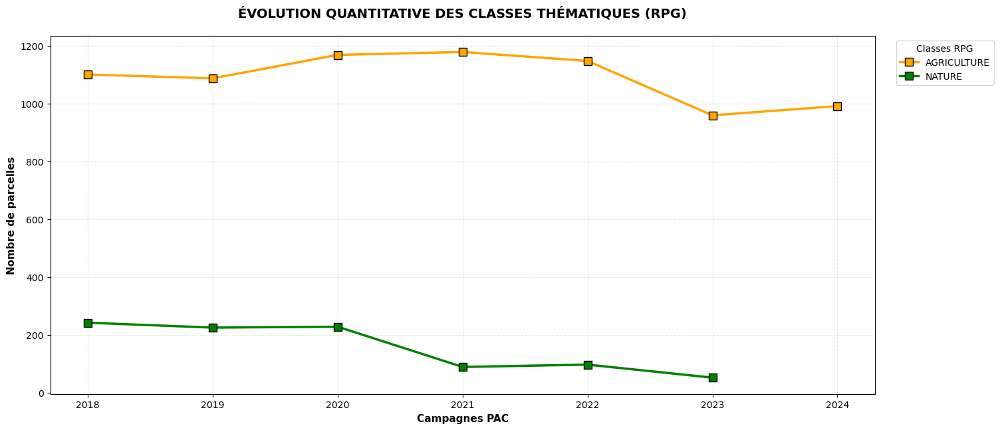

In [4]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os

# --- 1. CONFIGURATION ET RÉPERTOIRE ---
output_dir = "C:/Users/liege/Desktop/GEOLAB/SORTIE_CARTES_RPG"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

COLOR_MAPPING = {
    'ARTIFICIALISE': '#ffc0cb', 'AGRICULTURE': '#ffa500', 'BOIS': '#8b4513',
    'NATURE': '#008000', 'EAU': '#0000ff', 'AUTRE': '#ffffff'
}
RPG_CATEGORIES = list(COLOR_MAPPING.keys())
CUSTOM_CMAP = ListedColormap(list(COLOR_MAPPING.values()))

# --- 2. CHARGEMENT ET JOINTURE SÉCURISÉE ---
gdf_zones = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/ZONE.gpkg")
gdf_cad = gpd.read_file("C:/Users/liege/Desktop/GEOLAB/ENTRER/CADASTRE.gpkg")

df_attr = pd.read_csv("C:/Users/liege/Desktop/GEOLAB/SORTIE/SYNTHESE_RPG_FREQUENCE.csv", sep=None, engine='python')
df_attr.columns = df_attr.columns.str.strip()

df_attr['PL'] = df_attr['PL'].astype(str).str.strip().str.zfill(11)

gdf_cad['PL_KEY'] = (
    gdf_cad['CODE_DEP'].astype(str).str.zfill(2) + 
    gdf_cad['CODE_COM'].astype(str).str.zfill(3) + 
    gdf_cad['SECTION'].astype(str).str.zfill(2) + 
    gdf_cad['NUMERO'].astype(str).str.zfill(4)
).str.zfill(11)

gdf_complet = gdf_cad.merge(df_attr, left_on='PL_KEY', right_on='PL', how='left')

gdf_complet['DOMINANTE'] = gdf_complet['DOMINANTE'].fillna('AUTRE')
gdf_complet['SCORE_STABILITE'] = gdf_complet['SCORE_STABILITE'].fillna(0)
gdf_complet['PROBA_PONDEREE'] = gdf_complet['PROBA_PONDEREE'].fillna(0)

gdf_complet['DOMINANTE'] = pd.Categorical(gdf_complet['DOMINANTE'], categories=RPG_CATEGORIES)

# --- 3. MISE EN PAGE TECHNIQUE ---
def apply_layout(ax, title, geom_dalle, parcelles_bounds):
    minx, miny, maxx, maxy = parcelles_bounds
    margin_side, margin_bottom = 0.07, 0.22 
    
    ax.set_xlim(minx - (maxx-minx)*margin_side, maxx + (maxx-minx)*margin_side)
    ax.set_ylim(miny - (maxy-miny)*margin_bottom, maxy + (maxy-miny)*margin_side)
    
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True); spine.set_linewidth(1.5); spine.set_edgecolor('black')

    ax.annotate('', xy=(0.05, 0.92), xytext=(0.05, 0.85), xycoords='axes fraction',
                arrowprops=dict(facecolor='black', width=1, headwidth=6))
    ax.text(0.05, 0.95, 'N', transform=ax.transAxes, fontsize=10, fontweight='bold', ha='center')
    
    scalebar = AnchoredSizeBar(ax.transData, 500, '500 m', loc='lower right', pad=1.5, 
                               color='black', frameon=False, size_vertical=2, fontproperties={'size': 8})
    ax.add_artist(scalebar)
    
    gpd.GeoSeries([geom_dalle]).boundary.plot(ax=ax, color='red', linewidth=1.2, linestyle='--', zorder=10)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)

# --- 4. GÉNÉRATION DES BANDES DE DALLES ---
for idx, zone in gdf_zones.sort_values('DALLE').iterrows():
    nom_dalle = zone['DALLE']
    geom_dalle = zone['geometry']
    parcelles_dalle = gdf_complet[gdf_complet.intersects(geom_dalle)].copy()
    
    if parcelles_dalle.empty: continue
    bounds = parcelles_dalle.total_bounds 

    fig, axes = plt.subplots(1, 3, figsize=(26, 10), facecolor='white')
    fig.suptitle(f"ZONE DALLE {nom_dalle} (RPG)", fontsize=18, fontweight='bold', y=0.92)

    # 1. RÉCURRENCE
    ax = axes[0]
    ax_ins1 = inset_axes(ax, width="45%", height="3%", loc='lower left', borderpad=1.8)
    parcelles_dalle.plot(column='SCORE_STABILITE', ax=ax, cmap='RdYlGn', 
                         edgecolor='black', linewidth=0.05,
                         legend=True, cax=ax_ins1, legend_kwds={'orientation': "horizontal"})
    ax_ins1.set_title("Stabilité (%)", fontsize=8, pad=3)
    apply_layout(ax, "RÉCURRENCE", geom_dalle, bounds)

    # 2. FIABILITÉ
    ax = axes[1]
    ax_ins2 = inset_axes(ax, width="45%", height="3%", loc='lower left', borderpad=1.8)
    parcelles_dalle.plot(column='PROBA_PONDEREE', ax=ax, cmap='Blues', 
                         edgecolor='black', linewidth=0.05,
                         legend=True, cax=ax_ins2, legend_kwds={'orientation': "horizontal"})
    ax_ins2.set_title("Fiabilité", fontsize=8, pad=3)
    apply_layout(ax, "FIABILITÉ", geom_dalle, bounds)

    # 3. RPG FINALE
    ax = axes[2]
    parcelles_dalle.plot(column='DOMINANTE', ax=ax, cmap=CUSTOM_CMAP, categorical=True, edgecolor='black', linewidth=0.1)
    patches = [plt.Rectangle((0,0),1,1, color=COLOR_MAPPING[cat]) for cat in RPG_CATEGORIES]
    ax.legend(patches, RPG_CATEGORIES, loc='lower left', ncol=3, fontsize=7.5, frameon=True, borderaxespad=1.0)
    apply_layout(ax, "USAGE DU SOL (RPG)", geom_dalle, bounds)

    plt.subplots_adjust(wspace=0.12, top=0.85)
    plt.savefig(os.path.join(output_dir, f"ZONE_DALLE_RPG_{nom_dalle}.png"), dpi=300, bbox_inches='tight')
    plt.show()

# --- 5. GRAPHIQUE D'ÉVOLUTION RPG (SANS LA CLASSE 'AUTRE') ---
cols_temp = [c for c in df_attr.columns if c.startswith('DOM_')]
if cols_temp:
    df_evol = df_attr[cols_temp].apply(pd.Series.value_counts).T
    df_evol.index = [c.split('_')[1] for c in df_evol.index]

    plt.figure(figsize=(16, 7), facecolor='white')
    for cat in RPG_CATEGORIES:
        # CONDITION : On ignore la catégorie 'AUTRE' pour le graphique
        if cat == 'AUTRE':
            continue
            
        if cat in df_evol.columns:
            plt.plot(df_evol.index, df_evol[cat], marker='s', label=cat, color=COLOR_MAPPING[cat], 
                     linewidth=2.5, markersize=8, markeredgecolor='black')

    plt.title("ÉVOLUTION QUANTITATIVE DES CLASSES THÉMATIQUES (RPG)", fontsize=14, fontweight='bold', pad=20)
    plt.xlabel("Campagnes PAC", fontsize=11, fontweight='bold')
    plt.ylabel("Nombre de parcelles", fontsize=11, fontweight='bold')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.legend(title="Classes RPG", bbox_to_anchor=(1.02, 1), loc='upper left')

    plt.savefig(os.path.join(output_dir, "EVOLUTION_GENERALE_RPG_SANS_AUTRE.png"), dpi=300, bbox_inches='tight')
    plt.show()